## 🎯 Challenge
*Optimization of soft-mobility drop-off points*

## Team: Data Dreamers
## 👥 Authors
* Ronney Mathews
* Nikhil Kulkarni
* Luckshan Sivakumar
* Sourabh Hujare



### Data Cleaning

In [1]:
import os
import numpy as np
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
pd.set_option('display.max_rows',5)

import requests
import json 
from pandas.io.json import json_normalize

import geopandas 
from geopandas import GeoDataFrame, GeoSeries, read_file
from geopandas.tools import sjoin
from shapely.geometry import Point

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Data Conversion for Drop-off poins (aka Parking spots)

#load json object
with open('Soft-Mobility\\E-Scooter Parks\e-scooter_parks.json') as f:
    d = json.load(f)
features = pd.json_normalize(d['features'])
park_spots=features.rename(columns = {'attributes.n_id':'id','geometry.y':'lat','geometry.x':'lon'})
park_spots

,attributes.objectid_1,attributes.toponimo,id,attributes.estado,attributes.sinal_vert,attributes.sinal_info_vert,attributes.n_lugares,lon,lat
0,199,Rua de D. Pedro V,204,ATIVO,NAO,SIM,10,-8.630972,41.149252
1,32,Rua de D. Pedro V,35,ATIVO,NAO,SIM,10,-8.632475,41.147499
...,...,...,...,...,...,...,...,...,...
214,132,ADAGU0,136,ATIVO,None,SIM,10,-8.659702,41.167479
215,183,REECA0,188,ATIVO,None,SIM,10,-8.653902,41.173706


Some EDA using Qgis Tool and Tableau to understand the data.

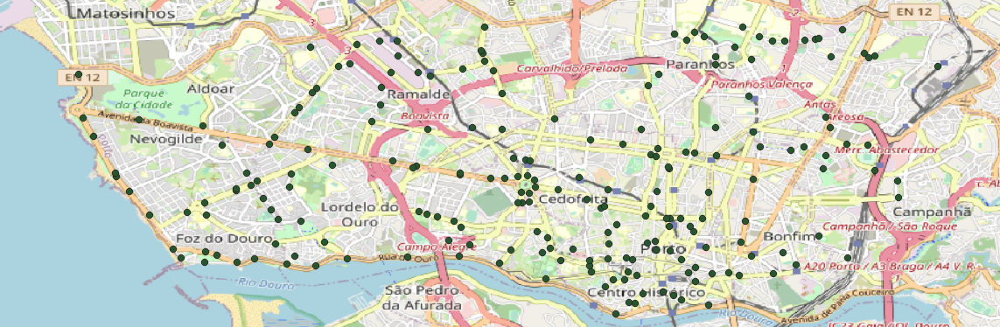

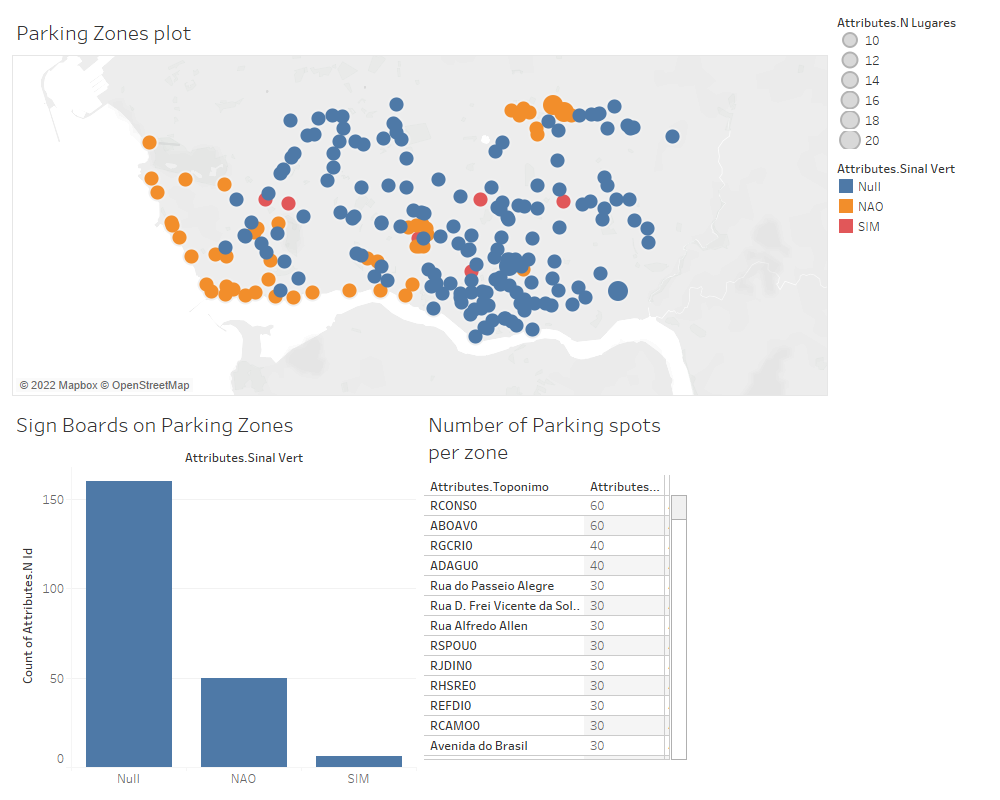

Mostly we see not many parking signboards. The first improvement that can be done is to put up signboards for drop-off points.

In [3]:
# Read e-scooter data
df_escooter = pd.read_csv('Soft-Mobility\\E-Scooter OD\\wdl_od_view.csv')
df_escooter

,recorded,id,device_id,timestamp,event_types,vehicle_state,trip_state,telemetry_timestamp,trip_id,lat,lng
0,1634809115769,1,a7990baa-909e-42ed-8546-a2a9d2e42b3c,1634734083000,{trip_leave_jurisdiction},elsewhere,NaN,1634734079000,6e073f7f-b955-4033-b7bd-6237faa51507,41.147263,-8.674807
1,1635342117495,1223,abf136d8-a3d4-4d5f-92bf-70f5986fc5cb,1635342117000,{maintenance_pick_up},removed,NaN,1635342113000,NaN,41.168862,-8.671213
...,...,...,...,...,...,...,...,...,...,...,...
489277,1646826805440,492424,c1117f6a-9c3d-489a-8931-3a8c2a2897ae,1646826805000,{trip_start},on_trip,NaN,1646826773000,bb515ee3-3132-470f-967e-127d874b79af,41.148293,-8.644670
489278,1646826810234,492425,fa88710f-f67d-42fa-9758-cc0855049eab,1646826810000,{trip_start},on_trip,NaN,1646826390000,ee20fad6-9861-4d68-b31c-1b656c66cc1b,41.148308,-8.644626


In [4]:
df_escooter["event_types"].unique()

array(['{trip_leave_jurisdiction}', '{maintenance_pick_up}',
       '{trip_start}', '{trip_end}', '{battery_low}',
       '{unspecified,located}', '{located,battery_low}', '{trip_cancel}',
       '{trip_enter_jurisdiction}', '{located}', '{provider_drop_off}',
       '{missing}', '{comms_lost}', '{comms_restored,battery_low}',
       '{reservation_start}', '{reservation_cancel}', '{missing,located}',
       '{unspecified}', '{trip_end,battery_low}',
       '{provider_drop_off,battery_low}', '{comms_restored}',
       '{missing,located,battery_low}', '{located,trip_start}',
       '{battery_charged}', '{decommissioned}',
       '{battery_charged,trip_start}', '{trip_cancel,battery_low}',
       '{reservation_cancel,comms_lost}', '{located,reservation_start}',
       '{trip_end,comms_lost}', '{trip_end,missing}',
       '{trip_cancel,comms_lost}', '{trip_cancel,missing}',
       '{provider_drop_off,trip_start}',
       '{provider_drop_off,reservation_start}',
       '{trip_end,decommissi

In [5]:
df_escooter["vehicle_state"].value_counts()

available          143102
elsewhere           96841
                    ...  
non_operational     12301
reserved             1733
Name: vehicle_state, Length: 7, dtype: int64

Visualizing entire e-scooter data on the map

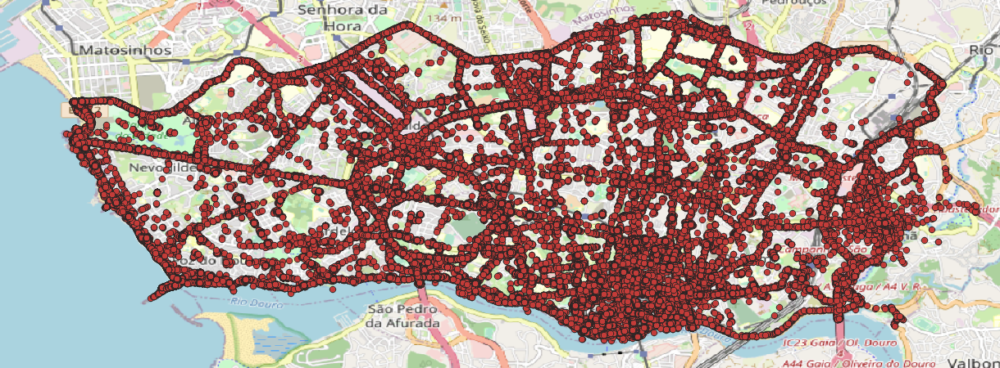

Check Appendix for more Visualizations made using Tableau

As we are dealing with the analysis of Dropoff points, we shall analyze only those data points where trip was ended successfully and the e-scooter was availble for next rider.

In [6]:
df_filtered = df_escooter[(df_escooter.event_types == '{trip_end}')&(df_escooter.vehicle_state == 'available')]
print("Number of data points after filtering are {}".format(len(df_filtered)))

Number of data points after filtering are 65091


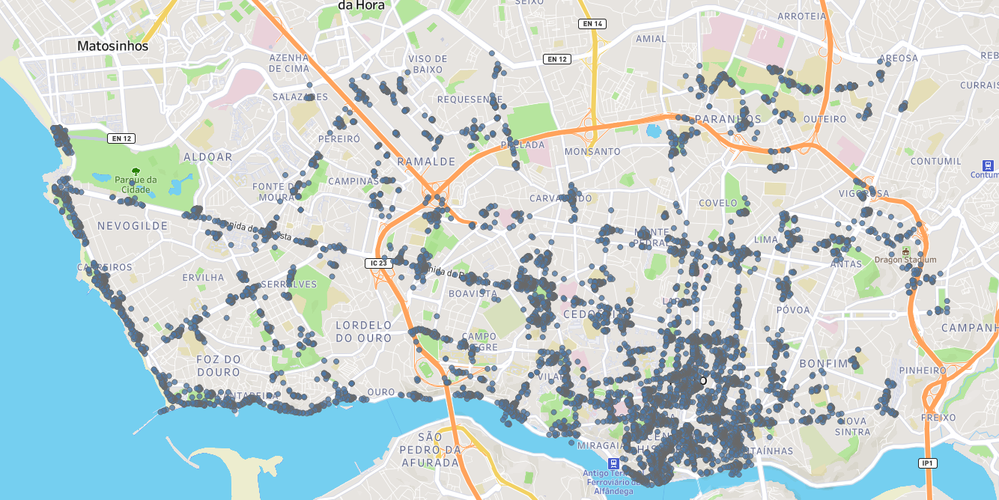

In [7]:
# Get the date range of data collection
df_filtered['dt']=pd.to_datetime(df_filtered.timestamp, utc=True, unit='ms')
df_filtered['dt'].describe()

count                         65091
unique                        64422
                    ...            
first     2021-10-26 21:13:45+00:00
last      2022-03-09 12:03:35+00:00
Name: dt, Length: 6, dtype: object

We have e-scooter data of dropoffs from 2021-10-26 till 2022-03-09 i.e **135 Days of Data**. Lets check data per week.

In [8]:
df_filtered['isoweek'] = pd.to_datetime(df_filtered['dt']).dt.strftime('%V')
df_weekly = df_filtered.groupby("isoweek").size().reset_index(name='counts')
fig = px.bar(df_weekly, x = "isoweek", y = "counts",title = 'Total Data points per week')
fig.show()

Week 43 of 2021 and Week 10 of 2022 have less data as the data we have begins and ends respectively in the mid-way of those weeks.

In [9]:
df_weekly[(df_weekly.isoweek != '10') & (df_weekly.isoweek != '43') ]['counts'].mean()

3511.9444444444443

Around 3500 trips per week on average i.e Average of 500 Trips per day.

In [10]:
#Check for missing values
print(df_filtered["lat"].isna().sum())
print(df_filtered["lng"].isna().sum())

0
0


In [11]:
df_filtered

,recorded,id,device_id,timestamp,event_types,vehicle_state,trip_state,telemetry_timestamp,trip_id,lat,lng,dt,isoweek
8,1635282825320,9,272befd6-c2b3-427a-9df8-f2c5beae0fc3,1635282825000,{trip_end},available,NaN,1635282818000,51b286fb-b584-4ee8-a5b6-4754bd72f127,41.145935,-8.614270,2021-10-26 21:13:45+00:00,43
10,1635282830422,11,af89a091-37e4-4942-8bf3-96ca1d07a3b8,1635282830000,{trip_end},available,NaN,1635282794000,508afb72-33b0-49b7-9fd7-89e673f63c38,41.155803,-8.619203,2021-10-26 21:13:50+00:00,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...
489262,1646826437446,492414,c2508b8f-765c-47d4-a536-fab6a4057139,1646826437000,{trip_end},available,NaN,1646826432000,6ae98228-3fe0-445b-b043-a35e4c36608f,41.177109,-8.594488,2022-03-09 11:47:17+00:00,10
489267,1646827415324,492447,8f709a54-4357-4943-9e4e-21824a596c78,1646827415000,{trip_end},available,NaN,1646827394000,8cbb513f-7a21-405c-8f11-8fcde55e5410,41.151512,-8.617985,2022-03-09 12:03:35+00:00,10


In [12]:
#Saving cleaned and filtered file in csv for some Tableau EDA
df_filtered.to_csv('wdl_clean_stage2.csv')

We need to define some metrics to analayse the performance of drop-off points.

### Granular Metrics

#### 1) Efficiency

We define the efficiency of a Drop-off zone as the ratio of number of e-scooters parked in the 10 metre radius of the dropoff zone to the number of e-scooters parked in the 50 metre radius. i.e

**Efficiency = (No. of drop-offs in 10m radius) / (No. of drop-offs in 50m radius)**

PS: 10m and 50m are just suggested values which can be changed later to measure performance.

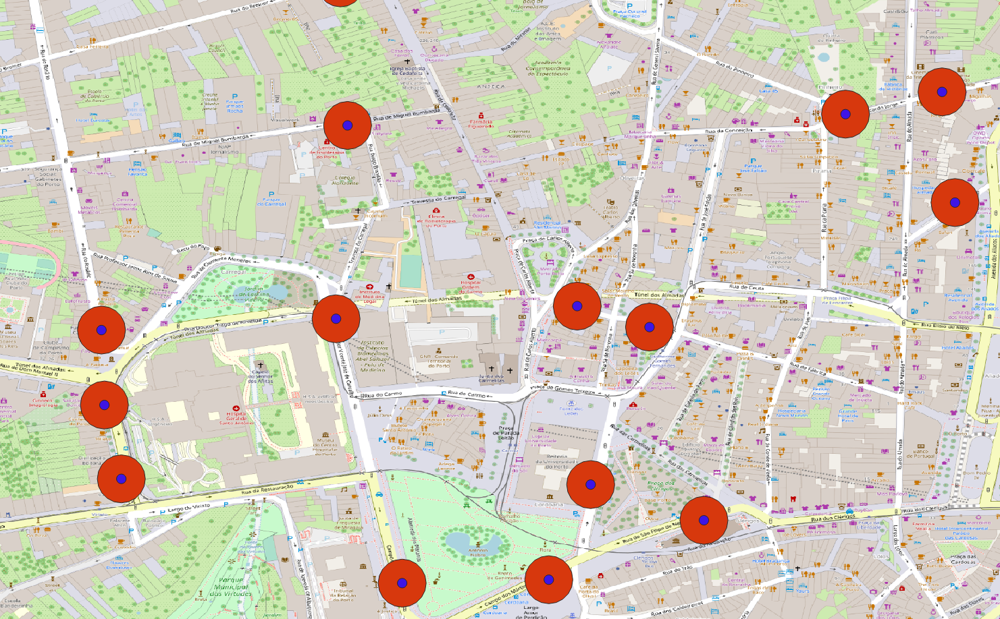

The blue circle in the above diagram is the 10m radius and the red circle is approx 50m radius. The shape files with these as buffer values is generated and is used to calculate the efficiency of a drop-off zone

##### Method : Point In polygon

In [13]:
park_zones_shp_file = ('shp_file')
park_zones_shp = read_file(park_zones_shp_file)
park_zones_shp.rename(columns={"geometry.x": "lng", "geometry.y": "lat", "attributes": "objectid_1", "attribut_2": "n_id"
                              , "attribut_1": "toponimo"
                              , "attribut_3": "estado"
                              , "attribut_4": "sinal_vert"
                              , "attribut_5": "sinal_info_vert"
                              , "attribut_6": "n_lugares"},inplace=True)

In [14]:
gdf = GeoDataFrame(df_filtered
, geometry=geopandas.points_from_xy(df_filtered.lng, df_filtered.lat))
gdf.crs=park_zones_shp.crs

In [15]:
park_stops_enriched = sjoin(gdf,park_zones_shp,
                      how='inner', op='within')

In [16]:
#10 m buffer
park_zones_shp_file_10 = ('Shapes/Buffered_10')
park_zones_shp_10 = read_file(park_zones_shp_file_10)
park_zones_shp_10.rename(columns={"geometry.x": "lng", "geometry.y": "lat", "attributes": "objectid_1", "attribut_2": "n_id"
                              , "attribut_1": "toponimo"
                              , "attribut_3": "estado"
                              , "attribut_4": "sinal_vert"
                              , "attribut_5": "sinal_info_vert"
                              , "attribut_6": "n_lugares"},inplace=True)
park_stops_enriched_10 = sjoin(gdf,park_zones_shp_10,
                      how='left', op='within')
spots_10_count=pd.DataFrame(park_stops_enriched_10.groupby("n_id", sort=False)["trip_id"].count())
spots_10_count.rename(columns={"trip_id": "10_m_buffer"},inplace=True)

In [17]:
#55 m buffer
park_zones_shp_file_55= ('Shapes/Buffered_55')
park_zones_shp_55= read_file(park_zones_shp_file_55)
park_zones_shp_55.rename(columns={"geometry.x": "lng", "geometry.y": "lat", "attributes": "objectid_1", "attribut_2": "n_id"
                              , "attribut_1": "toponimo"
                              , "attribut_3": "estado"
                              , "attribut_4": "sinal_vert"
                              , "attribut_5": "sinal_info_vert"
                              , "attribut_6": "n_lugares"},inplace=True)

park_stops_enriched_55 = sjoin(gdf,park_zones_shp_55,
                      how='left', op='within')

spots_55_count=pd.DataFrame(park_stops_enriched_55.groupby("n_id", sort=False)["trip_id"].count())
spots_55_count.rename(columns={"trip_id": "55_m_buffer"},inplace=True)

In [18]:
spots_count_merged=pd.merge(spots_10_count, spots_55_count,
how='outer', on='n_id')
spots_count_merged['efficiency']=spots_count_merged['10_m_buffer']/spots_count_merged['55_m_buffer']
efficiency=spots_count_merged.sort_values(by=['efficiency'],ascending=False).fillna(0)
efficiency['n_id']=efficiency.index


In [19]:
efficiency

,10_m_buffer,55_m_buffer,efficiency,n_id
n_id,,,,
72.0,1.0,1,1.000000,72.0
200.0,26.0,27,0.962963,200.0
...,...,...,...,...
145.0,0.0,22,0.000000,145.0
142.0,0.0,28,0.000000,142.0


#### 2) Utility

In the above metric of Efficiency, we see that there's a parking spot with efficicency 100% but it is based on only one data point. Therefore we also need to find the utility of these parking spots.

We define utility as the ratio of number of data points in 55m radius to the average number of data points per parking spot.

Avg number of data points per parking spot = 65000 / 216 ~ 300

In [20]:
metrics = efficiency
metrics['utility'] = metrics['55_m_buffer']/300
metrics

,10_m_buffer,55_m_buffer,efficiency,n_id,utility
n_id,,,,,
72.0,1.0,1,1.000000,72.0,0.003333
200.0,26.0,27,0.962963,200.0,0.090000
...,...,...,...,...,...
145.0,0.0,22,0.000000,145.0,0.073333
142.0,0.0,28,0.000000,142.0,0.093333


#### 3) Effectivenss

Defining effectiveness as product of efficiency and utility to get the combined effect of those metrics.

In [21]:
metrics['effectiveness'] = metrics['efficiency'] * metrics['utility']
metrics.to_csv('metrics.csv')
metrics.sort_values(by=['effectiveness'], ascending=False)

,10_m_buffer,55_m_buffer,efficiency,n_id,utility,effectiveness
n_id,,,,,,
4.0,1323.0,2706,0.488914,4.0,9.020000,4.410000
66.0,637.0,1036,0.614865,66.0,3.453333,2.123333
...,...,...,...,...,...,...
145.0,0.0,22,0.000000,145.0,0.073333,0.000000
142.0,0.0,28,0.000000,142.0,0.093333,0.000000


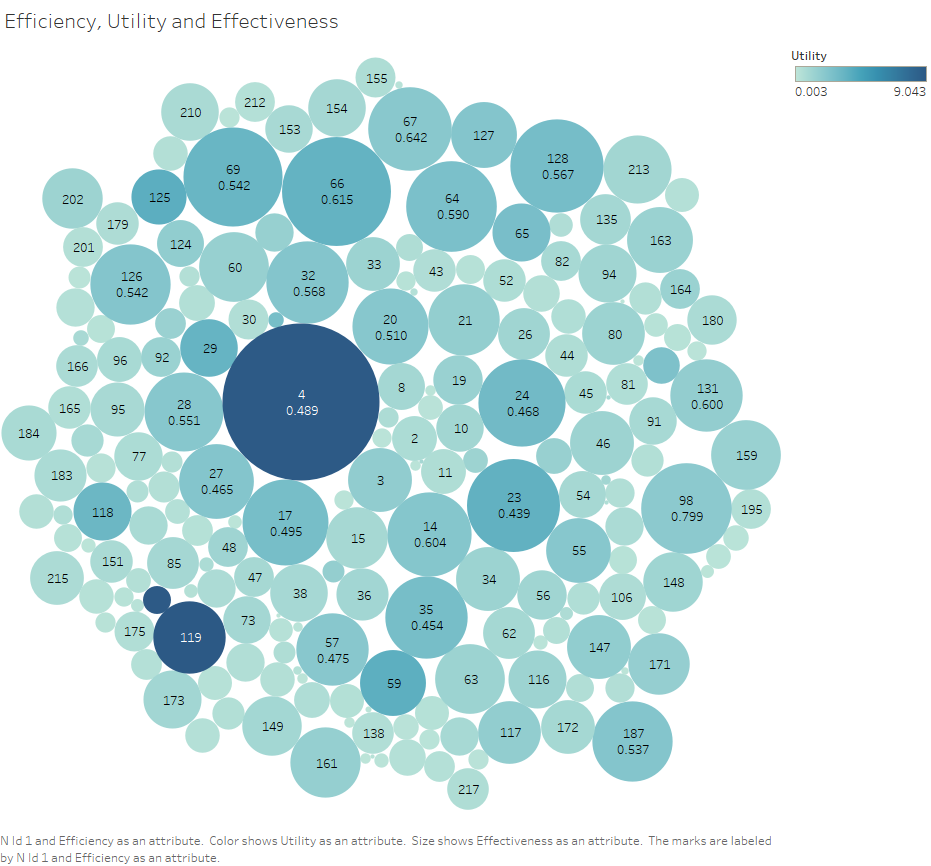

### Clustering Model

Lets apply a clustering algorithm to find how the drop-offs locations are clustered. We make around 400 clusters (Almost double of existing drop-off points) in order to spot and analyze cluster centers which are different from designated drop-off points.

In [22]:
from sklearn.cluster import KMeans
X=df_filtered[['lat','lng']]

Kmean = KMeans(algorithm='auto', n_clusters=400, n_init=40,tol=0.0001,random_state=0)
labels=Kmean.fit_predict(X)
centroids = Kmean.cluster_centers_

Kmeans_result_df=pd.DataFrame(centroids)

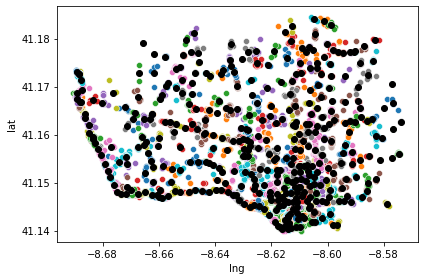

In [23]:
#Plotting
from matplotlib.pyplot import figure
import seaborn as sns

centroids = Kmean.cluster_centers_

u_labels = np.unique(labels)
 
#plotting the results:
plt. clf() 
for i in u_labels:
    sns.scatterplot(
        x=X[labels == i]['lng'],
        y=X[labels == i]['lat'])

plt.scatter(centroids[:,1] , centroids[:,0] 
            , color = 'k')
plt.rcParams["figure.figsize"] = (20,3)

plt.tight_layout()
plt.show()

In [24]:
#cluster locations
df_cluster_loc = Kmeans_result_df
df_cluster_loc

,0,1
0,41.166646,-8.625180
1,41.166752,-8.687810
...,...,...
398,41.182557,-8.612762
399,41.171343,-8.627228


In [25]:
# adding cluster ids to df
df_filtered['cluster_id'] = labels.tolist()
df_cluster_size = df_filtered.groupby('cluster_id').size().reset_index(name='size')
df_cluster_size

,cluster_id,size
0,0,356
1,1,679
...,...,...
398,398,3
399,399,2


In [26]:
#combined cluster data
df_cluster = df_cluster_loc.reset_index().merge(df_cluster_size, left_on='index',right_on='cluster_id',how='left').rename(columns={'index':'id',0:'lat',1:'lon'})[['id','lon','lat','size']]
df_cluster

,id,lon,lat,size
0,0,-8.625180,41.166646,356
1,1,-8.687810,41.166752,679
...,...,...,...,...
398,398,-8.612762,41.182557,3
399,399,-8.627228,41.171343,2


### Network Metrics

The granular metrics gave the KPI of each dropoff point but we also need a metric to assess the overall performance of the configuration/network of dropoff points. For this purpose, we define the 2 "Key Performance Indicators" (KPIs) for network as follows:

1) **Network closeness** is the ratio of number of dropoff points in the 20m radius of any of the cluster centers to the total number of dropoff points.

2) **Network utilization** is the ratio of number of e-scooters dropped off at network location in 20m radius to the total number of e-scooter dropoffs in total.

PS: 20m is taken here as minimum gap between clusters was mentioned as 40m in the challenge, therefore 20m can be considered as a jusrisdiction of a drop-off point.

In [27]:
#Formula to calculate distance between lat long coordinates

from math import radians, cos, sin, asin, sqrt
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km

In [28]:
#If df1 and df2 and list of points with lat and lon then
# Defining a function to do cross joining between points and calculating distances between them

def distances(df1,df2):
    df1['key'] = 0
    df2['key'] = 0
    df_dist = df1[['id','lon','lat','key']].merge(df2, on='key', how='outer')
    df_dist['distance'] = [haversine(df_dist['lon_x'].iloc[i],df_dist['lat_x'].iloc[i],df_dist['lon_y'].iloc[i],df_dist['lat_y'].iloc[i]) for i in range(len(df_dist))]
    df_dist['distance'] = df_dist['distance'].round(decimals=4)
    return df_dist

##### Network metrics for existing parking spots

In [29]:
df_cross = distances(park_spots,df_cluster)
df_cross

,id_x,lon_x,lat_x,key,id_y,lon_y,lat_y,size,distance
0,204,-8.630972,41.149252,0,0,-8.625180,41.166646,356,1.9940
1,204,-8.630972,41.149252,0,1,-8.687810,41.166752,679,5.1409
...,...,...,...,...,...,...,...,...,...
86398,188,-8.653902,41.173706,0,398,-8.612762,41.182557,3,3.5810
86399,188,-8.653902,41.173706,0,399,-8.627228,41.171343,2,2.2480


In [30]:
#Network Closeness : 
n_closeness_1 = len(df_cross[(df_cross.distance<=0.020)]['id_x'].unique())/len(df_cross['id_x'].unique())
print("Network closeness for given Parking Spots = ",n_closeness_1)

Network closeness for given Parking Spots =  0.8981481481481481


In [31]:
#Network Utilization :
df_supply = df_cross[(df_cross.distance<=0.020)][['id_y','size']].drop_duplicates()
supply = df_supply['size'].sum()
demand = df_cluster.sort_values(by = 'size',ascending=False).head(216)['size'].sum()
n_utilization_1 = supply/demand
print("Network Utilization for given Parking Spots = ",n_utilization_1)

Network Utilization for given Parking Spots =  0.9254286434694907


In [32]:
print("Netwrok Efficiency = ",n_closeness_1*n_utilization_1)

Netwrok Efficiency =  0.8311720223753759


The above metrics will help us validate our optimization model that we build and also helps monitor the performance of our dropoff locations configuration over time, which serves as a very nice product feature to incorporate later.

#### Analysis of Clusters away from parking spots
In 400 clusters that we got, there are many points that are clusters due to the presence of a drop-off point at that location. So we get two questions?
- What factors contribute to formation of other clusters ? Lets investigate this using some external data.
- If we create a random drop-off point somewhere, how many drop-off data points might appear on an average at that location (just because its an official drop-off location) ?

In [33]:
#Clusters formed due to parking spots
parkspot_clusters = df_cross[(df_cross.distance<=0.050)][['id_y']].drop_duplicates()

#Other clusters
i1 = df_cluster.set_index('id').index
i2 = parkspot_clusters.set_index('id_y').index
df_leftover_clusters = df_cluster[~i1.isin(i2)]
df_leftover_clusters

,id,lon,lat,size,key
6,6,-8.615621,41.148815,678,0
31,31,-8.638019,41.172568,3,0
...,...,...,...,...,...
398,398,-8.612762,41.182557,3,0
399,399,-8.627228,41.171343,2,0


##### Checking using Tourism spots 

Using Overpass API to get tourism locations in Porto.

In [34]:
overpass_url = "https://lz4.overpass-api.de/api/interpreter"
overpass_query="""
    [out:json];
    area[name="Porto"];
    node[tourism](area)(41.139903,-8.690462,41.184475,-8.573785);
    out body;
"""
response = requests.get(overpass_url, params={'data':overpass_query})
tourism_spots = pd.json_normalize(response.json()['elements'])
tourism_spots

,type,id,lat,lon,tags.information,tags.name,tags.tourism,tags.internet_access,tags.internet_access:fee,tags.website,...,tags.internet_access:ssid,tags.description:en,tags.description:es,tags.playground,tags.source:pkey,tags.source:url,tags.bar,tags.pets_allowed,tags.museum_type,tags.subject
0,node,285947106,41.140839,-8.614739,office,Posto Turístico,information,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node,473890464,41.158334,-8.606774,NaN,Residencial Grande Rio,hotel,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776,node,9654710579,41.144116,-8.622588,NaN,NaN,apartment,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
777,node,9664401790,41.142666,-8.603555,NaN,NaN,viewpoint,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
# Create a function to get different spots in porto using Overpass API

def overpass_api(param):
    overpass_url = "https://lz4.overpass-api.de/api/interpreter"
    overpass_query="""
        [out:json];
        area[name="Porto"];
        node["""+param+"""](area)(41.139903,-8.690462,41.184475,-8.573785);
        out body;
    """
    response = requests.get(overpass_url, params={'data':overpass_query})
    data = pd.json_normalize(response.json()['elements'])
    return data

In [36]:
#We can define a function to tag clusters

df_tags = pd.DataFrame()
def tag_clusters(df_spots,radius,tag):
    df_cross_tags = distances(df_spots,df_leftover_clusters)
    df_temp = df_cross_tags[(df_cross_tags.distance<=radius)][['id_y','size']].drop_duplicates()
    df_temp['tag'] = tag
    return df_temp

In [37]:
bus_stop_spots=overpass_api("highway=bus_stop")
df_spot_tag = tag_clusters(bus_stop_spots,0.05,"bus_stop")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  56


In [39]:
tourism_spots=overpass_api("tourism")
df_spot_tag = tag_clusters(tourism_spots,0.05,"tourism")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  42


In [40]:
rail_spots = overpass_api("railway~\"^(stop|station|subway|tram_stop)$\"")
df_spot_tag = tag_clusters(rail_spots,0.05,"rail_stop")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  15


In [42]:

study_places_spots = overpass_api("amenity~\"^(school|college|university|library)$\"")
df_spot_tag = tag_clusters(study_places_spots,0.05,"study_places")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  5


In [43]:

parking_places_spots = overpass_api("amenity~\"^(bicycle_parking|parking_space)$\"")
df_spot_tag = tag_clusters(parking_places_spots,0.05,"parking_places")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  6


In [45]:
toilets_spots = overpass_api("amenity=toilets")
df_spot_tag = tag_clusters(toilets_spots,0.05,"toilets")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  5


In [46]:

party_places_spots = overpass_api("amenity~\"^(pub|bar|nightclub)$\"")
df_spot_tag = tag_clusters(party_places_spots,0.05,"party_places")
print("Number of Clusters nearby : ",len(df_spot_tag))
df_tags = df_tags.append(df_spot_tag)

Number of Clusters nearby :  15


In [47]:
df_tags.to_csv('df_tags.csv')

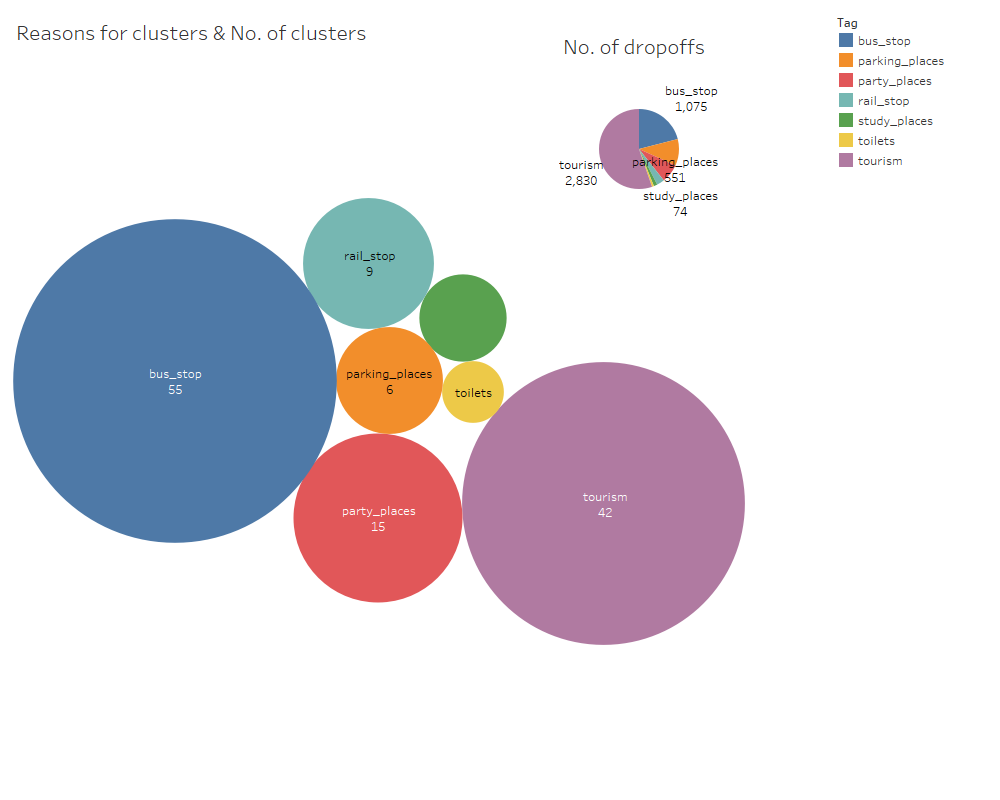

From the above analysis we understand that some e-scooter dropoff clusters are formed due to presence of certain points of interest in the city and lack of a parking-spot nearby them. Therefore we must optimize the parking-spot locations to cater to this.

We need to discard some bad performing drop-off points and select some good parking spots from the following many good options we have:
- Existing good drop-off points
- tourism spots
- bus stops

The conditions given in the challenge are:
- select maximum of 210 parking zones only
- Minimum distance between them should be 40m

Lets build an optimization model that takes care of the above constraints and picks parking spots such that our metrics are maximized.

### Optimization Model

This problem is similar to a Facility Location problem but with differences such as we need to select drop-off points such that they are close to the clusters and also they should be close to clusters of bigger sizes. Hence we shall carefully design our objective function of the optimization model to account for both.

In [48]:
df_options = park_spots[['id','lon','lat']].append(tourism_spots[['id','lon','lat']])\
.append(bus_stop_spots[['id','lon','lat']])\
.append(party_places_spots[['id','lon','lat']])

df_options = df_options.drop_duplicates()
df_options

,id,lon,lat
0,204,-8.630972,41.149252
1,35,-8.632475,41.147499
...,...,...,...
158,9560987797,-8.659315,41.159530
159,9590511990,-8.607105,41.151444


Lets denote cluster centers as **Customers** and potential drop-off points as **Facility**

In [49]:
Customer = list(df_cluster.id)
Facility = list(df_options.id)

In [50]:
# calculate distance between cluster points and dropoff option points
df_crossjoin = distances(df_cluster,df_options)

In [51]:
# Convert it into dictionary of the distances from each facility to all the customers 
df_dict = df_crossjoin.pivot(index='id_x', columns='id_y', values='distance')
trans = df_dict.to_dict('dict')

In [52]:
# Calculating distance among dropoff option points, required for the 40m constraint
df_cross_options = distances(df_options,df_options)

# df of points in the 40m radius of eachother
df_close = df_cross_options[(df_cross_options.distance <= 0.040)&(df_cross_options.distance > 0)]

We want to minimize the distance of the drop-off points we select from 

In [53]:
from pulp import *

# Setting the Problem
prob = LpProblem("Facility Location Problem", LpMinimize)
    
# Defining our Decision Variables
use_facility = LpVariable.dicts("Use Facility", Facility, 0, 1, LpBinary)
ser_customer = LpVariable.dicts("Service", [(i,j) for i in Customer for j in Facility],  0, 1, LpBinary)
    
# Setting the Objective Function
prob += lpSum((trans[j][i]*trans[j][i]/df_cluster['size'].iloc[i])*ser_customer[(i,j)] for j in Facility for i in Customer)


In [54]:
for j in Facility:
    prob += lpSum(ser_customer[(i,j)] for i in Customer) == use_facility[j]

prob += lpSum(use_facility[j] for j in Facility) == 210

for i in df_close.id_x:
    for j in df_close[df_close.id_x == i].id_y:
        prob += use_facility[i] + use_facility[j] <= 1

In [55]:
prob.solve()

1

In [56]:
print("Solution Status = ", LpStatus[prob.status])

Solution Status =  Optimal


In [57]:
# Print Optimal
print("Total Cost = ", value(prob.objective))

Total Cost =  5.8501311741373704e-05


In [58]:
# Print the solution of Binary Decision Variable - use_facility
facilities=[]
Tolerance = 0.0001
for j in Facility:
    if use_facility[j].varValue > Tolerance:
        print("Open Drop-off point = ", j)
        facilities.append(j)
df_facility = pd.DataFrame (facilities, columns = ['id'])

Open Drop-off point =  204
Open Drop-off point =  35
Open Drop-off point =  171
Open Drop-off point =  79
Open Drop-off point =  30
Open Drop-off point =  181
Open Drop-off point =  8
Open Drop-off point =  21
Open Drop-off point =  4
Open Drop-off point =  140
Open Drop-off point =  3
Open Drop-off point =  2
Open Drop-off point =  128
Open Drop-off point =  169
Open Drop-off point =  122
Open Drop-off point =  168
Open Drop-off point =  22
Open Drop-off point =  135
Open Drop-off point =  68
Open Drop-off point =  37
Open Drop-off point =  97
Open Drop-off point =  183
Open Drop-off point =  90
Open Drop-off point =  170
Open Drop-off point =  218
Open Drop-off point =  50
Open Drop-off point =  42
Open Drop-off point =  45
Open Drop-off point =  48
Open Drop-off point =  36
Open Drop-off point =  34
Open Drop-off point =  33
Open Drop-off point =  16
Open Drop-off point =  38
Open Drop-off point =  39
Open Drop-off point =  46
Open Drop-off point =  44
Open Drop-off point =  47
Open

In [60]:
df_facility = df_facility.merge(df_cluster[['id','lon','lat']], on='id',how='inner')\
.append(df_facility.merge(tourism_spots[['id','lon','lat']], on='id',how='inner'))\
        .append(df_facility.merge(bus_stop_spots[['id','lon','lat']], on='id',how='inner'))\
                .append(df_facility.merge(party_places_spots[['id','lon','lat']], on='id',how='inner'))

In [88]:
df_facility.to_csv('open_facilities.csv')
df_facility

,id,lon,lat,key
0,204,-8.621485,41.169622,0
1,35,-8.586109,41.148191,0
...,...,...,...,...
0,1223740137,-8.614890,41.141819,0
1,6372620124,-8.614362,41.148047,0


Plot of selected facilities : We see that our model selected many new drop-off points in the heart of the city as there is a big need there. 
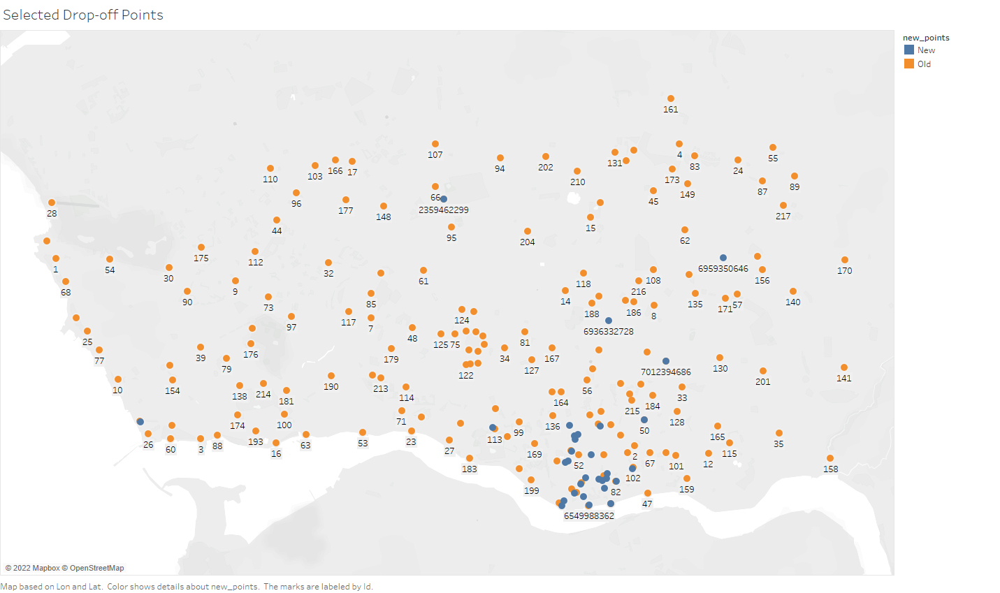

Also by giving a more diverese set of points to select from , we can get different configurations.

In [62]:
#Cross joining open facilities with clusters and getting their distances to calculate Network KPIs
df_network = distances(df_facility,df_cluster)

In [86]:
# Finding capacity of each dropoff point considering the total number of dropoffs in 100m radius 
# and dividing it by 135 as we have data for 135 days. It gives us average expected dropoff in that point per day

df_dropoff_size = df_network[(df_network.distance<=0.100)][['id_x','size']].groupby('id_x').sum()/135
df_dropoff_size['capacity'] = round(df_dropoff_size['size']/10)*10
df_dropoff_size

,size,capacity
id_x,,
1,6.985185,10.0
2,5.044444,10.0
...,...,...
7012394686,0.185185,0.0
7597585186,7.548148,10.0


In [64]:
#Network Closeness : 
n_closeness = len(df_network[(df_network.distance<=0.020)]['id_x'].unique())/len(df_network['id_x'].unique())
print("Network closeness for chosen facilities = ",n_closeness)

Network closeness for chosen facilities =  0.9380952380952381


In [65]:
#Network Utilization :
df_supply = df_network[(df_network.distance<=0.020)][['id_y','size']].drop_duplicates()
supply = df_supply['size'].sum() + len(df_facility[df_facility.id > 1000])*250
demand = df_cluster.sort_values(by = 'size',ascending=False).head(210)['size'].sum()
n_utilization = supply/demand
print("Network Utilization for given Parking Spots = ",n_utilization)

Network Utilization for given Parking Spots =  0.958368881726546


In [66]:
print("Netwrok Efficiency = ",n_closeness*n_utilization)

Netwrok Efficiency =  0.8990412842863312


Existing drop-off points have a network efficiency metric of **83.11 %** We achieved almost **90 %**, an efficiency increase of  **6.8 %** for the overall network of Drop-off points.

### Conclusion

The optimization model uses output from the clustering algorithm to suggest high performing drop-off points with their capacities. The objective function of our model makes sure that the metrics that make a drop-off point successful are maximized. Thus we successfully select drop-off points that are optimal.

A mock-up of the product that can be made 
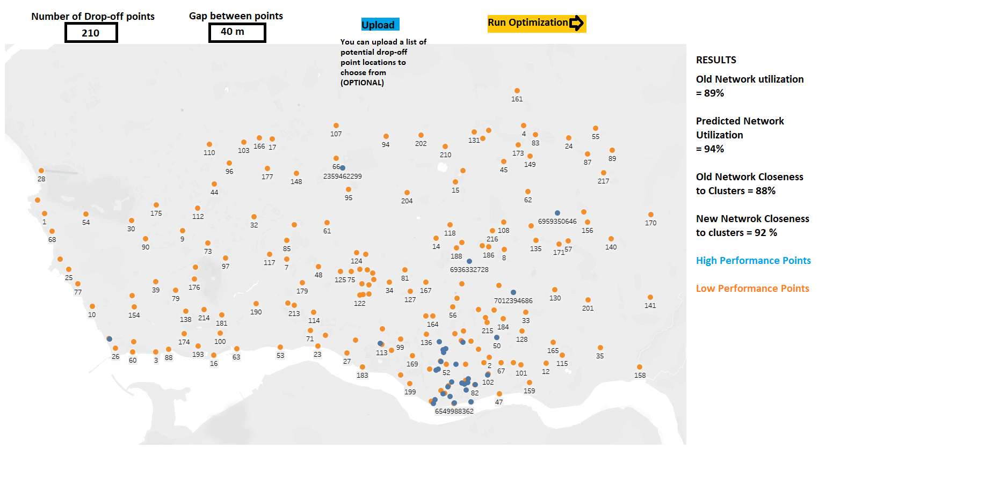

## 🖼️ Visualisations

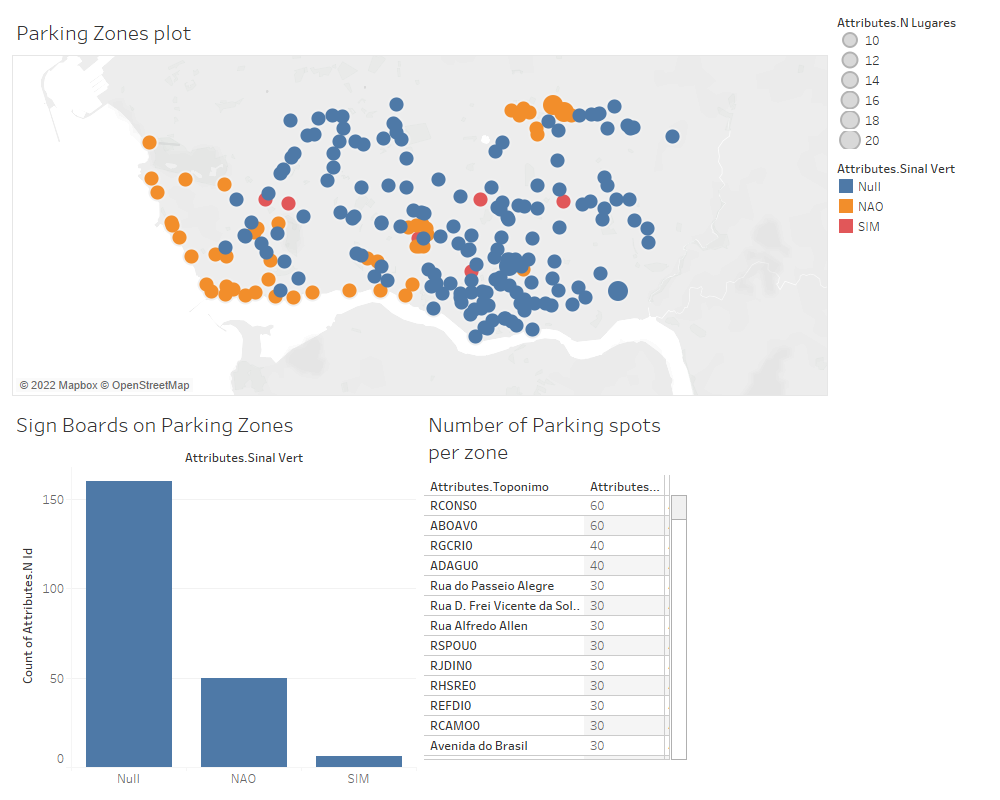

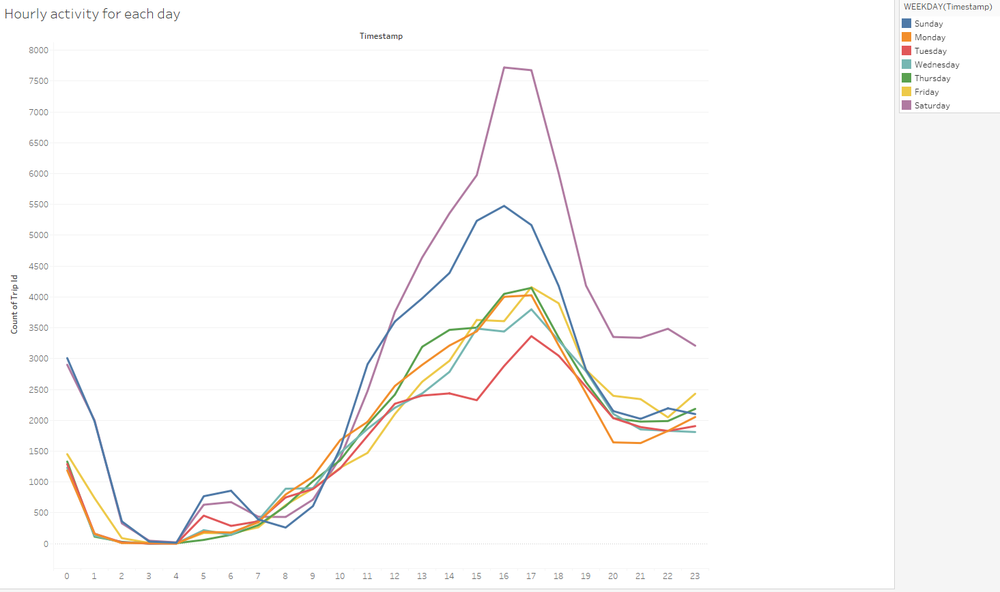

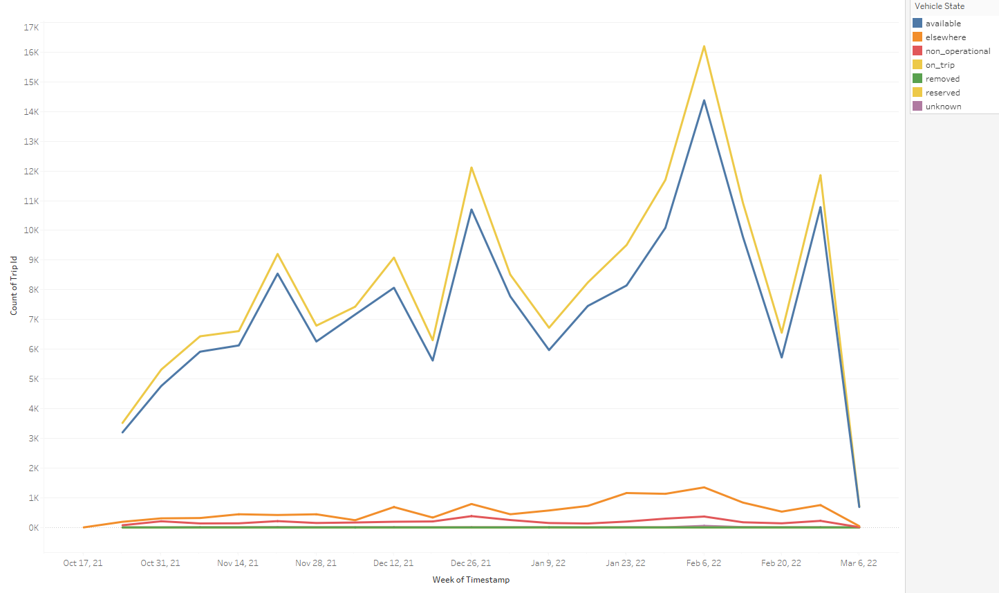

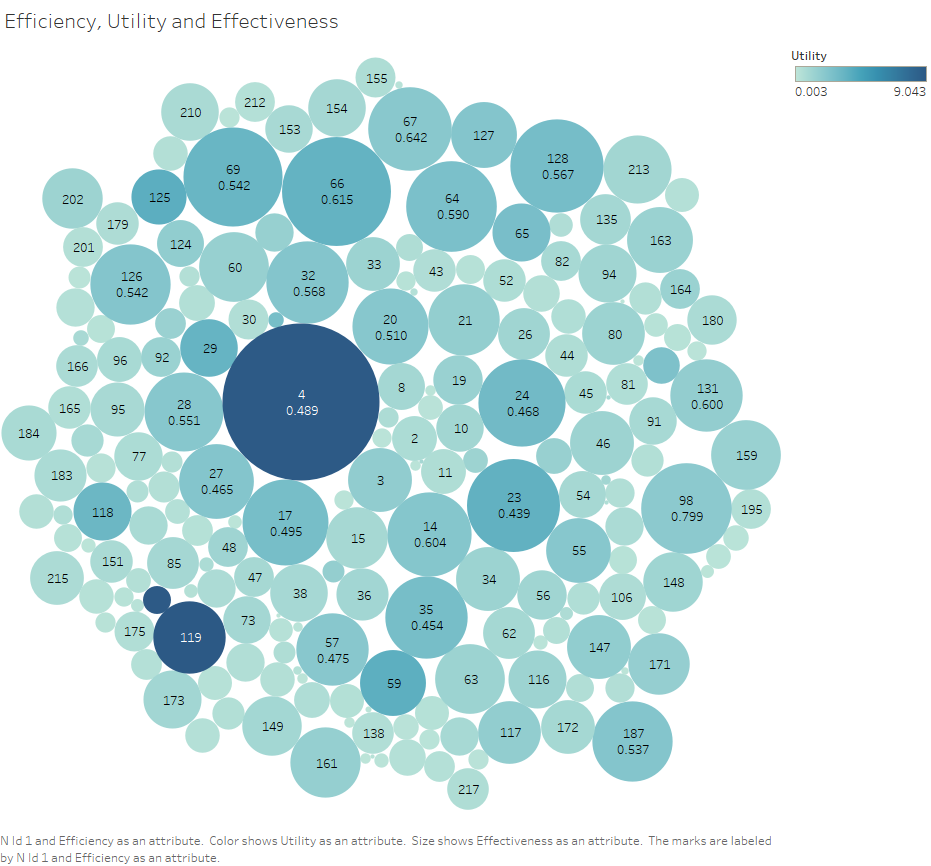

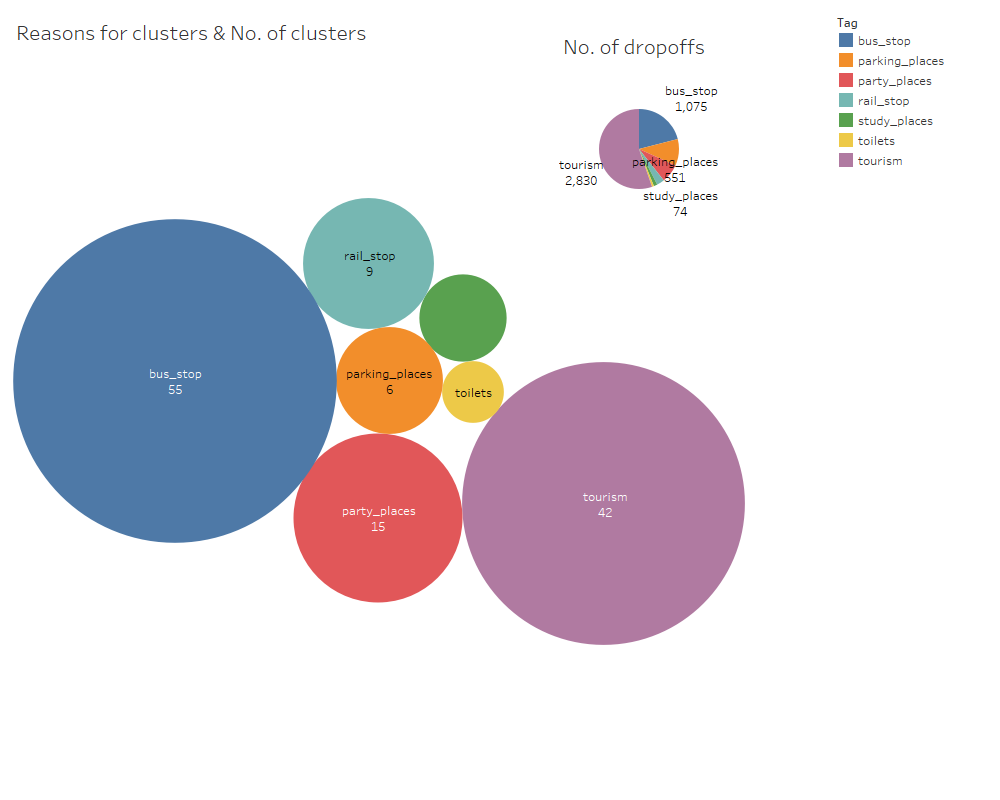

## 👓 References
1) https://taginfo.openstreetmap.org/
2) https://en.wikipedia.org/wiki/Porto

## ⏭️ Appendix